In [4]:
import sys
# sys.path.append(r"C:\Users\ferna\OneDrive\Documentos\MIS_COSAS_DE_THE_BRIDGE\Proyectos_Machine_Learning\co2_ml\src\utils")
sys.path.append("/Users/fersaol/Library/CloudStorage/OneDrive-Personal/Documentos/MIS_COSAS_DE_THE_BRIDGE/Proyectos_Machine_Learning/co2_ml/src/utils")

from co2_functions import Clustering
import general_purpose as gp
import pandas as pd
import numpy as np
import plotly.express as px
from sklearn.cluster import KMeans
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler,LabelEncoder, OneHotEncoder, PowerTransformer
from sklearn.compose import make_column_transformer
from sklearn.pipeline import make_pipeline
from sklearn.cluster import DBSCAN
from sklearn.neighbors import NearestNeighbors
from kneed import KneeLocator
from tqdm import tqdm
from yellowbrick.cluster import KElbowVisualizer
from sklearn.model_selection import GridSearchCV
import seaborn as sns
from sklearn.metrics import silhouette_samples,silhouette_score

In [9]:
pathmac = "/Users/fersaol/Library/CloudStorage/OneDrive-Personal/Documentos/MIS_COSAS_DE_THE_BRIDGE/Proyectos_Machine_Learning/co2_ml/src/data/processed/"
pathwin = "C:/Users/ferna/OneDrive/Documentos/MIS_COSAS_DE_THE_BRIDGE/Proyectos_Machine_Learning/co2_ml/src/data/processed/"
nombre = "df_v3.csv"
df = pd.read_csv(pathmac + nombre)
df.head()

,GDP,Population,Energy_production,Energy_consumption,CO2_emission,per_capita_production,Energy_intensity_by_GDP,balance,eficiency,energy_dependecy,use_intensity_pc,co2_pc,latitude,longitude,Year,Country,Energy_type,CODE_x,continent
0,279.389,15182.60,0.150,0.155,0.0,104.341,5.670,-0.005,0.0,0.001,0.0,0.0,6.424,-66.59,1980-01-01,Venezuela,renewables_n_other,VEN,South America
1,279.389,15182.60,5.000,0.812,0.0,104.341,5.670,4.188,0.0,0.003,0.0,0.0,6.424,-66.59,1980-01-01,Venezuela,petroleum_n_other_liquids,VEN,South America
2,279.389,15182.60,0.616,0.616,0.0,104.341,5.670,0.000,0.0,0.002,0.0,0.0,6.424,-66.59,1980-01-01,Venezuela,natural_gas,VEN,South America
3,279.389,15182.60,0.001,0.002,0.0,104.341,5.670,-0.000,0.0,0.000,0.0,0.0,6.424,-66.59,1980-01-01,Venezuela,coal,VEN,South America
4,278.376,15597.88,0.156,0.161,0.0,110.257,6.178,-0.005,0.0,0.001,0.0,0.0,6.424,-66.59,1981-01-01,Venezuela,renewables_n_other,VEN,South America


Vamos a realizar la clusterización de nuestros países. En primer lugar, vamos a realizarlo con todas las variables posibles y vamos a ver que resultados nos ofrece K-means. Para ello, primero vamos a estandarizar las variables numéricas, ya que K-Means trabaja mejor con variables que tengan una escala similar y después vamos a codificar las variables no numéricas para poder usarlas en el modelo:

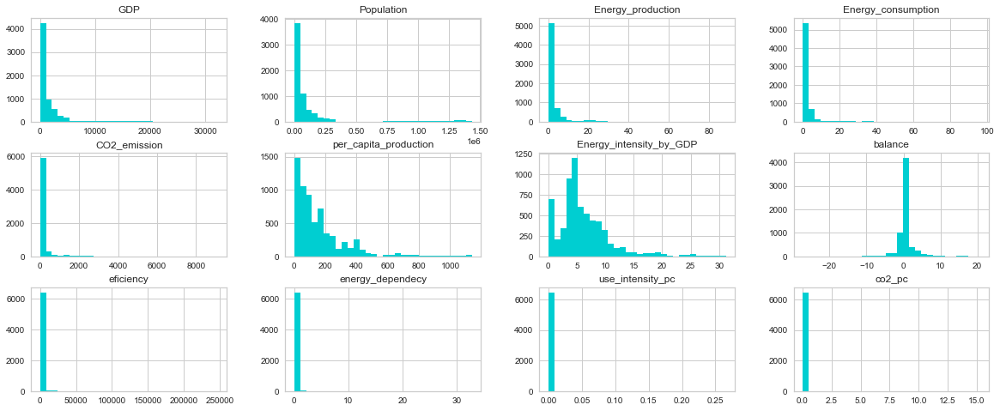

In [3]:
df_usar = df.select_dtypes(exclude="object").drop(["latitude","longitude"],axis=1)
gp.varios_plot(df_usar,color="darkturquoise")

Vemos que en la mayoría de los casos nuestros datos tienen una distribución exponencial o gamma y aunque algunos parece que fueran categóricos y solo tuvieran ceros, no es así, sino que no se ven los valores por la escala del gráfico.

In [13]:
a_escalar = df.select_dtypes(exclude="object").drop(["latitude","longitude"],axis=1)
scaled_vars = gp.escalado(PowerTransformer(),a_escalar,output="df")

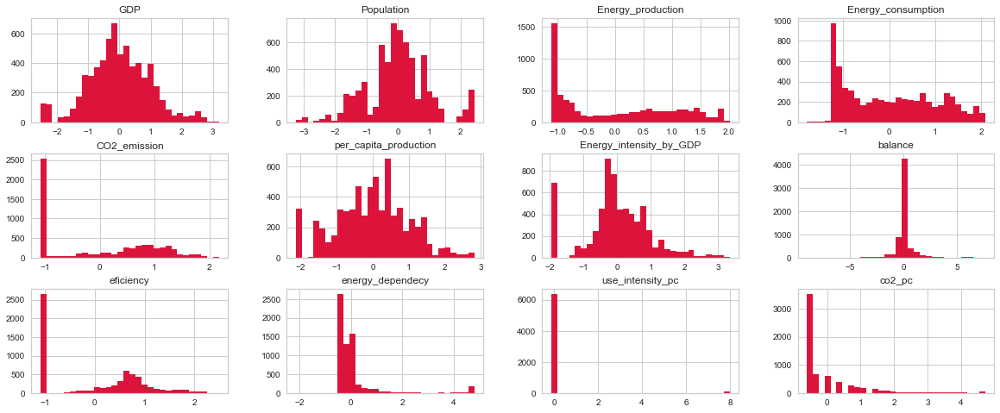

In [5]:
# como vemos hemos conseguido que en la mayoría de variablesa los datos tengan una forma más parecida a la distribución normal
gp.varios_plot(scaled_vars,color="crimson")

In [6]:
scaled_vars.shape

(6484, 12)

In [14]:
vars_encoded = gp.escalado(LabelEncoder(),df.Energy_type)

In [15]:
# las unimos para poder usarlas:
df_procesed = scaled_vars.copy()
df_procesed["energy_type"] = vars_encoded
df_procesed.head()

,GDP,Population,Energy_production,Energy_consumption,CO2_emission,per_capita_production,Energy_intensity_by_GDP,balance,eficiency,energy_dependecy,use_intensity_pc,co2_pc,energy_type
0,-0.464369,-0.497205,-0.762928,-0.796767,-1.089275,0.007172,0.092487,-0.093147,-1.094163,-0.279813,-0.125788,-0.609601,4
1,-0.464369,-0.497205,1.371884,0.193666,-1.089275,0.007172,0.092487,1.415672,-1.094163,0.154807,-0.125788,-0.609601,3
2,-0.464369,-0.497205,-0.057938,-0.020843,-1.089275,0.007172,0.092487,-0.091399,-1.094163,-0.057550,-0.125788,-0.609601,1
3,-0.464369,-0.497205,-1.113044,-1.203952,-1.089275,0.007172,0.092487,-0.091399,-1.094163,-0.512453,-0.125788,-0.609601,0
4,-0.466362,-0.481889,-0.750570,-0.782897,-1.089275,0.052672,0.205185,-0.093147,-1.094163,-0.279813,-0.125788,-0.609601,4


Veamos que valores se han asignado a cada uno de los labels de la variable tipo de energía:

In [8]:
pd.DataFrame({"energia":df.Energy_type.unique(),"valor_asignado":df_procesed.energy_type.unique()})


,energia,valor_asignado
0,renewables_n_other,4
1,petroleum_n_other_liquids,3
2,natural_gas,1
3,coal,0
4,nuclear,2


dado que LabelEncoder() establece números para cada label, los estimadores detectan que existe una magnitud de cantidad o de orden en ellos, de manera que en este caso le estamos diciendo que las renovables pesan 4 veces más que el gas natural, 2 más que la nuclear etc. Si tenemos en cuenta que lo que estamos midiendo es el nivel de contaminación, estaríamos diciendo que los países que usan renovables tienen un peso de 4 veces más que los que usan gas natural o carbón. Veamos como afecta esto a nuestra clasificación:

# K-Means

In [22]:
# vamos a realizar la primera clusterización con todas las variables a ver cuantos clusters obtenemos:
clustering = KMeans(random_state=1234).fit(df_procesed)
clusters1 = np.unique(clustering.labels_,return_counts=True)
pd.DataFrame({"clusters":clusters1[0],"num_paises":clusters1[1]}).set_index("clusters")

,num_paises
clusters,
0,1362
1,1355
2,1181
3,243
4,101
5,554
6,747
7,941


In [30]:
clustering.cluster_centers_.shape

(8, 13)

In [38]:
cluster_medio = pd.DataFrame({
    "cluster":clustering.labels_,
    "pais":df.Country.values,
    "co2":df.CO2_emission.values,
    "produccion":df.Energy_production.values})
cluster_medio = cluster_medio.groupby("pais").mean().sort_values("cluster",ascending=False)
cluster_medio

,cluster,co2,produccion
pais,,,
Japan,5.175000,221.200880,0.688765
Canada,4.610000,98.126295,3.322800
France,4.400000,76.489425,0.924440
Russia,4.280000,434.210465,11.328485
United States,4.200000,1058.019325,14.773425
India,4.025000,199.526595,1.908375
China,4.000000,1052.013612,12.541016
Germany,3.847059,143.129651,1.059475
United Kingdom,3.455000,108.131925,1.727055


En los dataframes anteriores, vemos como se han clasificado los diferentes países en cada cluster de media, y cuantos países ha habido en cada cluster. Pasemos al gráfico a tratar de identificar como han sido clasificados nuestros países por kmeans, y por tanto, si los pesos asignados a cada tipo de energía tiene sentido.
Mirando a los países principales analizados en el eda, y por tanto que entendemos más, observamos los siguiente:

In [31]:
# cojamos los países que nos interesan:
cluster_medio.loc[["China","United States","Russia"]]

,cluster
pais,
China,4.00
United States,4.20
Russia,4.28


Vemos que los colores 4 son los rosas, que en general se encuentran a lo largo de la parte media del gráfico, y se concentran en la punta derecha con los países que tienen mayor producción de energía y mayores emisiones de co2, pero no son los que más tienen, por lo que el valor asignado a los tipos de energía puede etar funcionando bien. Por otra parte, tenemos a países como Angola, South Africa etc que tienen poca producción de energía y pocas emisiones de co2, por lo que sigue teniendo sentido, estos están representados con el 1 que es el color verde oscuro. Para finalizar vemos que con 2 y 3, que son los colores naranja y turquesa, tenemos a países como Alemania, Reino Unido y Brasil, que son países con una producción media y emisiones medias igualmente. En definitiva, podemos decir que los label encoder no están mal asignados.

In [32]:
# Los representamos a través de dos variables representativas de este estudio:
px.scatter(data_frame=df_procesed,x="Energy_production",y="CO2_emission",
            color=clustering.labels_.astype("str"))

Para realizar el estudio de como se asignarían los cluster si usamos una regla de asignación definida por nosotros mismos vamos a ver cual es la emisión media de co2 de cada tipo de energía:

In [33]:
df.groupby("Energy_type")["CO2_emission"].mean()

Energy_type
coal                         264.023473
natural_gas                  111.226439
nuclear                        0.000000
petroleum_n_other_liquids    208.812459
renewables_n_other             0.000000
Name: CO2_emission, dtype: float64

Podemos apuntar que mediante el PowerTransformer los datos han variado la escala y se han centrado algo más entorno al 0 y la distribución parece más uniforme.
De todas maneras, aún visto lo anterior, vamos a ver que sucedería si manualmente asignamos los labels según la siguiente escala:
* 0: poco contaminante, energías renovables
* 1: algo contaminante, nuclear
* 2: contaminante, gas natural
* 3: bastante contaminante, petróleo
* 4: muy contaminante, carbón  

Ya que LabelEncoder() asigna pesos en función del número que tengan los labels, y nuestros labels sí que tienen un orden o peso, si nos basamos en la cantidad de co2 que emiten los países.

In [10]:
own_scale = {"renewables_n_other":0,"nuclear":1,"natural_gas":2,"petroleum_n_other_liquids":3,"coal":4}

In [16]:
df_procesed2 = scaled_vars.copy()
df_procesed2["energy_type"] = df.Energy_type.map(own_scale)
df_procesed2.head()

,GDP,Population,Energy_production,Energy_consumption,CO2_emission,per_capita_production,Energy_intensity_by_GDP,balance,eficiency,energy_dependecy,use_intensity_pc,co2_pc,energy_type
0,-0.464369,-0.497205,-0.762928,-0.796767,-1.089275,0.007172,0.092487,-0.093147,-1.094163,-0.279813,-0.125788,-0.609601,0
1,-0.464369,-0.497205,1.371884,0.193666,-1.089275,0.007172,0.092487,1.415672,-1.094163,0.154807,-0.125788,-0.609601,3
2,-0.464369,-0.497205,-0.057938,-0.020843,-1.089275,0.007172,0.092487,-0.091399,-1.094163,-0.057550,-0.125788,-0.609601,2
3,-0.464369,-0.497205,-1.113044,-1.203952,-1.089275,0.007172,0.092487,-0.091399,-1.094163,-0.512453,-0.125788,-0.609601,4
4,-0.466362,-0.481889,-0.750570,-0.782897,-1.089275,0.052672,0.205185,-0.093147,-1.094163,-0.279813,-0.125788,-0.609601,0


In [35]:
own_clusters = KMeans(random_state=1234).fit(df_procesed2)
px.scatter(data_frame=df_procesed2,x="Energy_production",y="CO2_emission",
            color=own_clusters.labels_.astype("str"))

In [37]:
cluster_medio2 = pd.DataFrame({
    "cluster":own_clusters.labels_,
    "pais":df.Country.values,
    "co2":df.CO2_emission.values,
    "produccion":df.Energy_production.values})
cluster_medio2 = cluster_medio2.groupby("pais").mean().sort_values("cluster",ascending=False)
cluster_medio2

,cluster,co2,produccion
pais,,,
Nigeria,6.443750,13.640881,1.254469
Colombia,6.400000,12.544725,0.746875
Argentina,6.120000,27.023410,0.576105
Czech Republic,5.800000,27.721367,0.265931
Slovakia,5.769231,17.229771,0.165285
Indonesia,5.718750,62.526681,2.124506
Malaysia,5.618750,28.762656,0.713556
Egypt,5.362500,32.599213,0.709956
Algeria,5.187500,20.127775,1.408187


En este caso, vemos que China, Rusia y Estados Unidos se han clasificado en media en 3.85, 2.78 y 3.6 respectivamente. Se mantiene que las medias estén cercanas, sobre todo de China y Estados Unidos, y por tanto ambos se encontrarían en un cluster cercano a 4, que los situaría en su mayoría cerca de los puntos naranjas, que son países que tienen niveles de contaminación altos, pero que en producción de energía son bastante heterogéneos. Pues los hay con mucha producción y con poca, estos estarían en la parte derecha con mucha producción.  
Por otra parte, Rusia estaría más cercano al 3, sin llegar a él, y tiene sentido porque Rusia es uno de los mayores productores de gas natural, que está calificado con un peso de 3. Se encontraría por tanto en el cluster 3 en la mayoría de las ocasiones, que son los verdes clarito, y es un cluster también heterogéneo en los países que están en él en el nivel de las x, que es la producción, al igual que el cluster 4, pero con poca contaminación general.
En esta clasificación me llaman mucho la atención los extremos del dataframe, ya que se califica a los Emiratos Unidos y a Canadá, por ejemplo, con valores por debajo de 2, que parece que son muy poco contaminantes, pero en realidad en el gráfico, los países calificados con dos son los azules claritos que se encuentran en medio del gráfico, con producciones a veces grandes y a veces pequeñas, pero con niveles de emisión de co2 moderadas por debajo de los grandes países, al igual que ocurre en el gráfico anterior. La diferencia con este gráfico es que el valor medio del cluster es más bajo, pero los clusters no representan valores sino cualidades, y la posición que ocupan en el gráfico es muy parecida.
En el caso de Nigeria, Colombia y Argentina se sitúan en este gráfico en torno al cluster 6 y 7 que son los morados y rojos, y en la anterior clasificación están en torno al cluster 2. Creo que es más coherente la clasificación de este gráfico porque tienen producciones pequeñas pero altas emisiones y por tanto se sitúan en su mayoría a la izquierda del gráfico. Sin embargo, en la clasificación con Label Encoder están cerca de los países Naranjas que en su mayoría tienen producciones más altas que ellos.

Antes de nada, vamos a ver si los clusters que se han generado son los óptimos, para ello vamos a ver la inercia que se genera en cada cluster. Es decir, vamos a ver la suma de los cuadrados de cada punto a su centroide para un rango de n clusters y establecer en que número de clusters la inercia empieza a decrecer en menor proporción de lo que lo venía haciendo, de tal manera que podamos tener un criterio a la hora de establecer cual podría ser un número de clusters idóneo. A partir de ese punto, la información captada por cada cluster, y por tanto la diferenciación de uno y otro, empieza a no ser significativa.

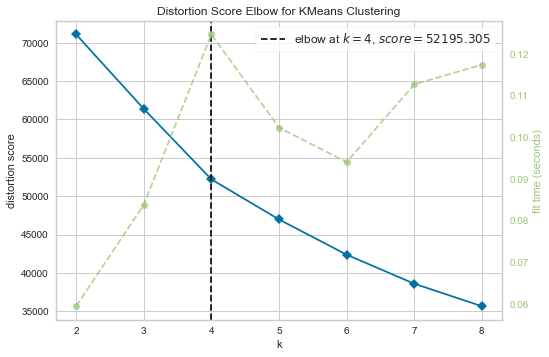

In [39]:
visualizer = KElbowVisualizer(KMeans(),k=(2,9)).fit(df_procesed2)
visualizer.show();

In [40]:
Clustering.grafico_codo(df_procesed2,semilla=1234,optimo=4)

k = 4 parece ser el óptimo debido a que el incremento del número de clusters desde 4 hasta 5 obtiene una reducción de la inercia significativamente menor que desde 3 hasta 4, y además la diferencia en la reducción de la inercia desde 5 hasta 6 no es mucho mayor que la de 4 hasta 5. Es decir, la disminución porcentual de la inercia conforme vamos aumentando los cluster va siendo cada vez menor hasta llegar a un punto en que no exista. De esta manera, podemos decir que estimar la inercia para un cluster solo no es suficiente para poder determinar si estamos escogiendo los clusters óptimos, dado que no podemos comparar, y cuanto mayor es k menor es la inercia.
Por tanto, al revisar nuestro supuesto de partida, en el que queríamos que nuestros países se clasificaran en poco contaminantes, contaminantes y muy contaminantes. Al no estar muy alejados de nuestra idea inicial, hemos decidido que a la vista de los resultados vamos ha añadir una nueva categoría a nuestro modelo inicial y los vamos a dividir en:
* poco contaminantes
* contaminación moderada
* contaminantes
* muy contaminantes

In [41]:
clustering2 = KMeans(n_clusters=4,random_state=1234).fit(df_procesed2)
clusters2 = np.unique(clustering2.labels_,return_counts=True)
resumen1 = pd.DataFrame({"clusters":clusters2[0],"num_datos":clusters2[1]})
resumen1

,clusters,num_datos
0,0,2427
1,1,2085
2,2,1871
3,3,101


In [42]:
px.scatter(data_frame=df_procesed2,x="Energy_production",y="CO2_emission",color=clustering2.labels_.astype("str"))

En nuestra clasificación con el Standard Scaler podíamos dividir los países de la siguiente manera:
* poco contaminantes se corresponde con el cluster 0
* contaminación moderada se corresponde con el cluster 1
* contaminantes se corresponde con el cluster 3
* muy contaminantes se corresponde con el cluster 2

Sin embargo con la división hecha con Power Transformer no vemos tan clara esta división, porque hay países en diferentes clusters en rangos de emisiones de co2 muy parecidas a lo largo de todo el gráfico.

In [17]:
prueba = df_procesed[["CO2_emission","Energy_production"]]

### VAMOS A REALIZAR ALGUNAS PRUEBAS ADICIONALES PARA VER SI CORROBORAMOS LAS CONCLUSIONES ANTERIORES
#### 2 variables:

In [18]:
# cogemos las dos variables que más representan nuestro estudio:
prueba.head()

,CO2_emission,Energy_production
0,-1.089275,-0.762928
1,-1.089275,1.371884
2,-1.089275,-0.057938
3,-1.089275,-1.113044
4,-1.089275,-0.750570


In [46]:
# Realizamos la clusterización en base a ellas
clustering3 = KMeans(random_state=1234)
clustering3.fit(prueba)

KMeans(random_state=1234)

In [47]:
# Vemos cuantos países tiene cada cluster en él:
datas3 = np.unique(clustering3.labels_,return_counts=True)
pd.DataFrame({"clusters":datas3[0],"num_paises":datas3[1]})


,clusters,num_paises
0,0,675
1,1,1835
2,2,1096
3,3,352
4,4,732
5,5,638
6,6,579
7,7,577


In [62]:
px.scatter(data_frame=prueba,x="Energy_production",
            y="CO2_emission",color=clustering3.labels_.astype("str"),
            title="2 variables,7 cluster")

Vemos que usando solo dos variables nos realiza los mismos cluster por defecto,pero se diferencian mucho mejor que con todas las variables.Parece ser que disminuyendo la complejidad del modelo se obtienen clusters mejor definidos y por tanto conclusiones más claras. Veamos si el optimo sigue siendo cuatro con esas dos variables:

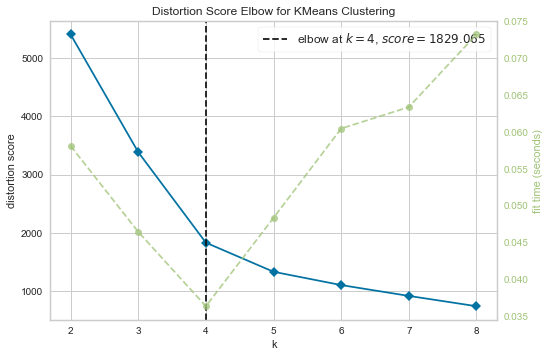

In [51]:
visualizer = KElbowVisualizer(KMeans(),k=(2,9)).fit(prueba)
visualizer.show();

In [52]:
Clustering.grafico_codo(prueba,semilla=1234,optimo=4)

Vemos que se confirma el hecho de que 4 clusters son el óptimo, por lo que vamos a clusterizarlos con ellos:

In [19]:
clustering_prueba = KMeans(n_clusters=4,random_state=1234)
clustering_prueba.fit(prueba)
unicos = np.unique(clustering_prueba.labels_,return_counts=True)
resumen_prueba = pd.DataFrame({"clusters":unicos[0],"num_paises":unicos[1]})
resumen_prueba

,clusters,num_paises
0,0,1374
1,1,2194
2,2,2044
3,3,872


In [20]:
px.scatter(data_frame=prueba,x="Energy_production",
y="CO2_emission",color=clustering_prueba.labels_.astype("str"),
title="2 variables, 4 clusters")

Se nos han repartido los países de manera bastante homogénea, con dos grandes grupos, el cluster 1 y el 2. Con la reducción de variables y usando PowerTransformer, las conclusiones son más claras.

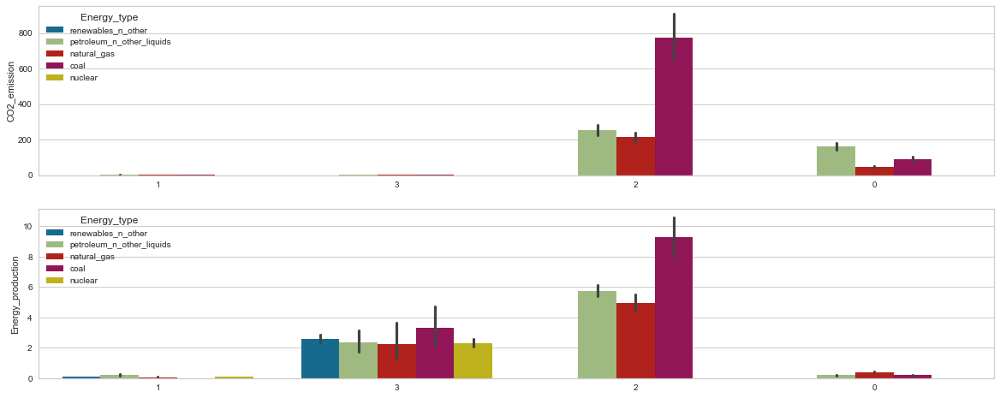

In [109]:
# Vemos como son se caracterizan los clusters creados:
fig,ax = plt.subplots(2,1,figsize=(20,8))
sns.barplot(data=prueba,x=clustering_prueba.labels_.astype("str"),y=df.CO2_emission,hue=df.Energy_type,ax=ax[0])
sns.barplot(x=clustering_prueba.labels_.astype("str"),y=df.Energy_production,hue=df.Energy_type,ax=ax[1])
plt.show()

Vemos que tenemos cuatro tipos de país diferente:
1. El cluster 0 son países con una producción de energía pequeña, pero no siendo los que menos tienen, y basada principalemnte en el petróleo, el gas natural y el carbón. Aunque son los terceros productores su contaminación es la segunda mayor. Por lo que podríamos resumir que son países con poca producción y bastantes emisiones de co2, nada eficientes.
2. El cluster 1 se caracteriza por tener países con poca producción y pocas emisiones de co2, son países que no resultan relevantes ni en producción ni en emisiones de co2, se basan en el petróleo en su mayoría, las renovables y el gas natural.
3. El cluster 2 tiene a los países con mayor producción y mayor emisión de co2 del mundo, muy por encima de los otros cluster. Estos son los países más importantes en producción y contaminación. Su producción está basada en el carbón, el gas natural y el petróleo, siendo las tecnologías que más emiten co2 el carbón con diferencia, luego el petróleo y por último el gas natural.
4. El cluster 3 tiene a países con muy buenas producciones de energía mundiales, con un mix muy diversificado, pues usan todas las fuentes de energía en proporciones similares y sus emisiones de co2 son muy bajas, al nivel del cluster 1 para una producción mucho mayor. Diríamos que estos países son los más eficientes y serían el objetivo a seguir.

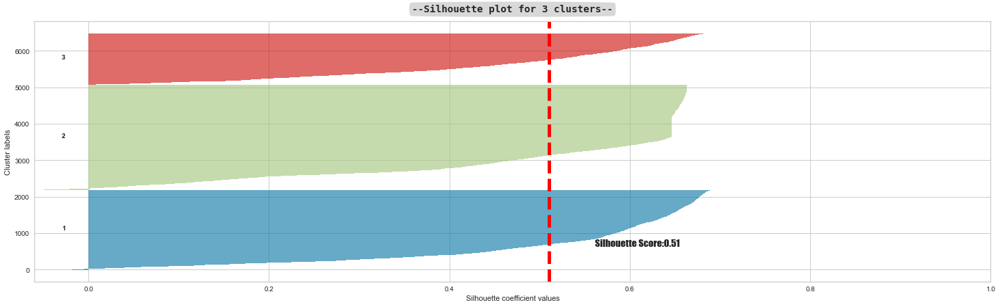

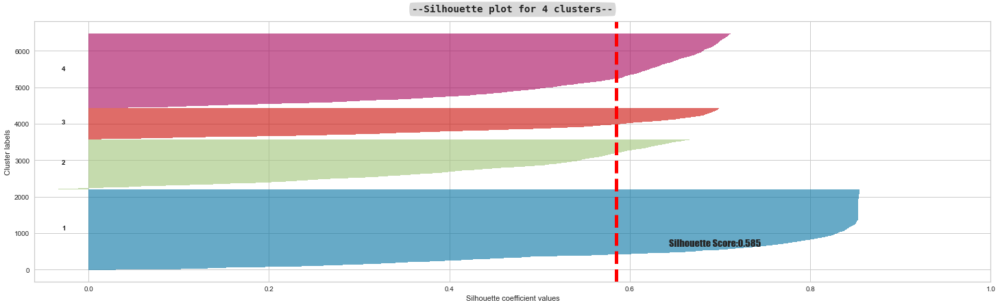

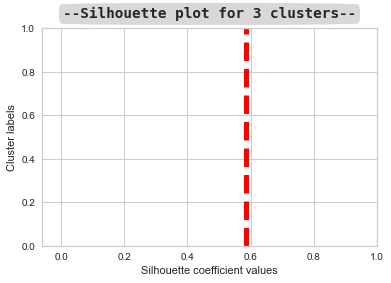

In [17]:
Clustering.grafico_silueta(prueba,estimador="k",n_clusters=[3,4])

In [148]:
cluster_pais = pd.DataFrame({"pais":df.Country,"cluster":clustering_prueba.labels_})
composicion_clusters = cluster_pais.groupby("cluster")
composicion_clusters

Veamos que países componen cada cluster, vamos a revisar los 15 más importantes de cada cluster:

In [158]:
# CLUSTER 0
pais,veces = np.unique(composicion_clusters.get_group(0)["pais"].values,return_counts=True)
pd.DataFrame({"pais":pais,"veces":veces}).sort_values("veces",ascending=False)[:15]

,pais,veces
9,France,117
15,Japan,117
10,Germany,96
21,Netherlands,78
25,Poland,78
3,Brazil,76
6,Colombia,74
31,Ukraine,61
29,South Africa,54
20,Mexico,47


In [159]:
# CLUSTER 1
pais,veces = np.unique(composicion_clusters.get_group(1)["pais"].values,return_counts=True)
pd.DataFrame({"pais":pais,"veces":veces}).sort_values("veces",ascending=False)[:15]

,pais,veces
1,Angola,126
2,Argentina,121
15,Iraq,107
30,South Africa,102
25,Oman,90
23,Nigeria,85
18,Kuwait,82
14,Iran,82
22,Netherlands,82
19,Libya,82


In [160]:
# CLUSTER 2
pais,veces = np.unique(composicion_clusters.get_group(2)["pais"].values,return_counts=True)
pd.DataFrame({"pais":pais,"veces":veces}).sort_values("veces",ascending=False)[:15]

,pais,veces
33,United States,120
5,Canada,114
26,Russia,114
6,China,98
32,United Kingdom,97
12,Indonesia,97
3,Australia,93
11,India,92
0,Algeria,75
27,Saudi Arabia,71


In [161]:
# CLUSTER 3
pais,veces = np.unique(composicion_clusters.get_group(3)["pais"].values,return_counts=True)
pd.DataFrame({"pais":pais,"veces":veces}).sort_values("veces",ascending=False)[:15]

,pais,veces
28,Russia,86
35,United States,80
10,France,79
5,Canada,79
16,Japan,73
24,Norway,63
11,Germany,62
6,China,56
34,United Kingdom,43
4,Brazil,40


Vemos como todos los países en unos momentos o en otros han estado en un cluster o en otro, es decir ha habido momentos en que los países lo han hecho mejor que en otros.
Vamos a probar con otra combinación de variables que pensamos puede ser interesante, usando la variable tipo de energía que también nos parece importante de tener, realizada mediante LabelEncoder():

In [53]:
# con label encoder:
prueba2 = df_procesed[["eficiency","Energy_production","energy_type"]]
Clustering.grafico_codo(prueba2,semilla=1234,optimo=4)

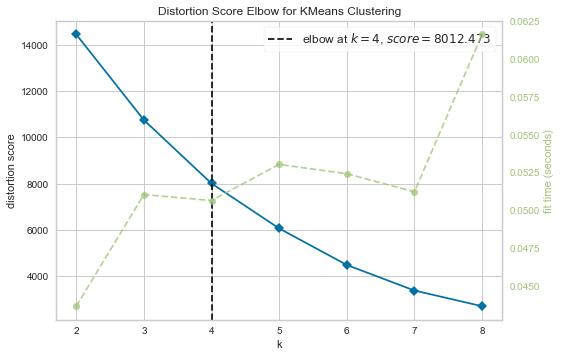

In [54]:
visualizer = KElbowVisualizer(KMeans(),k=(2,9)).fit(prueba2)
visualizer.show();

Observamos que aunque la distorsión ha cambiado de valor y ahora es mayor, el óptimo sigue estando en 4

In [64]:
# Ahora miramos lo mismo pero con el codificado realizado con la función map donde nosotros hemos elegido los números asignados:
prueba2_1 = df_procesed2[["eficiency","Energy_production","energy_type"]]
Clustering.grafico_codo(prueba2_1,semilla=1234,optimo=4)

El óptimo sigue siendo 4

In [127]:
# con label encoder:
clustering5 = KMeans(n_clusters=4,random_state=1234)
clustering5.fit(prueba2)
datas5 = np.unique(clustering5.labels_,return_counts=True)
resumen5 = pd.DataFrame({"clusters":datas5[0],"num_paises":datas5[1]})
resumen5

,clusters,num_paises
0,0,1497
1,1,2376
2,2,1088
3,3,1523


In [128]:
# con map:
clustering5_1 = KMeans(n_clusters=4,random_state=1234)
clustering5_1.fit(prueba2_1)
datas5_1 = np.unique(clustering5_1.labels_,return_counts=True)
resumen5_1 = pd.DataFrame({"clusters":datas5_1[0],"num_paises":datas5_1[1]})
resumen5_1

,clusters,num_paises
0,0,2319
1,1,2121
2,2,1513
3,3,531


Vemos que con label encoder y cuatro clusters se produce una clasficación más homogénea y con map los cluster mayoritarios son el 0 y el 1. Si los representamos:

In [129]:
px.scatter(data_frame=prueba2,x="Energy_production",
            y="eficiency",color=clustering5.labels_.astype("str"),
            title="4 clusters, energy type con labelencoder")

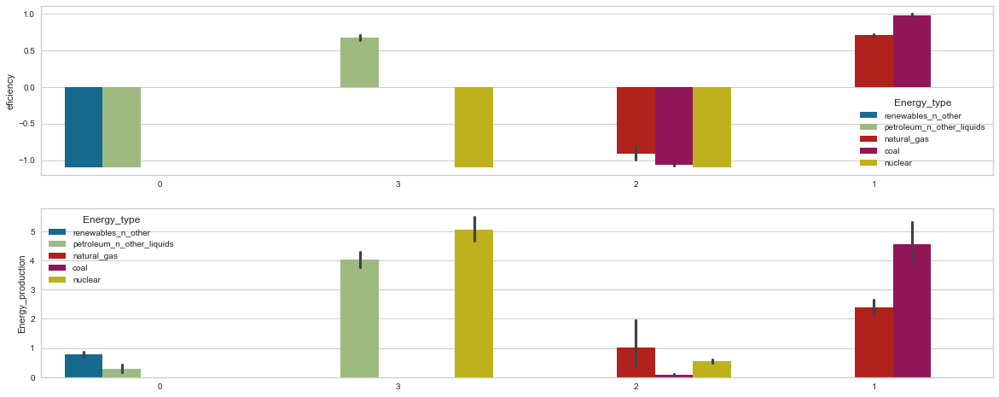

In [130]:
fig,ax = plt.subplots(2,1,figsize=(20,8))
sns.barplot(data=prueba2,x=clustering5.labels_.astype("str"),y="eficiency",hue=df.Energy_type,ax=ax[0])
sns.barplot(x=clustering5.labels_.astype("str"),y=df.Energy_production,hue=df.Energy_type,ax=ax[1])
plt.show()

Representamos los mismos gráficos pero usando la clusterización hecha con la variable mapeada energy_type:

In [126]:
px.scatter(data_frame=prueba2_1,x="Energy_production",
            y="eficiency",color=clustering5_1.labels_.astype("str"),
            title="4 cluster,energy type con map")

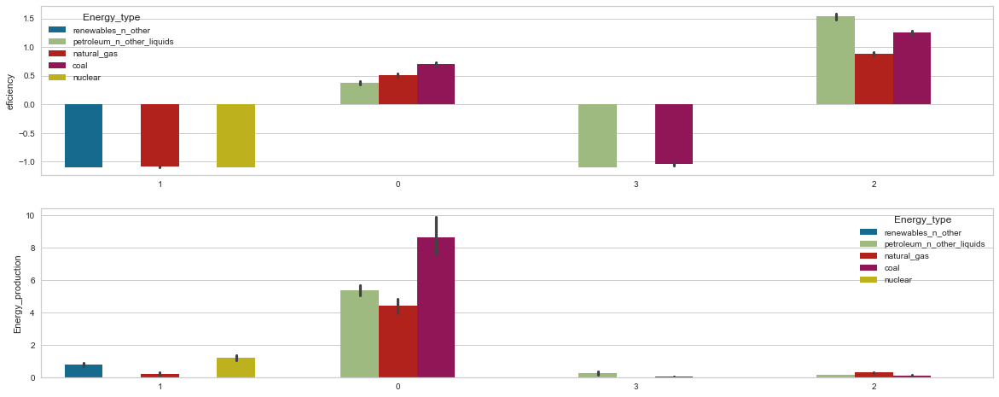

In [113]:
fig,ax = plt.subplots(2,1,figsize=(20,8))
sns.barplot(data=prueba2_1,x=clustering5_1.labels_.astype("str"),y="eficiency",hue=df.Energy_type,ax=ax[0])
sns.barplot(x=clustering5_1.labels_.astype("str"),y=df.Energy_production,hue=df.Energy_type,ax=ax[1])
plt.show()

Podemos apreciar que la clusterización con la variable energy type hecha con map es más clara y delimita mejor los clusters que la hecha con labelencoder. Además, mirando en la composición de los cluster, la hecha con map se parece más a la clusterización de dos variables que la hecha con label encoder de esta manera podemos ver que mirando la producción de energía y la eficiencia nuestros clusters con map se caraterizan de la siguiente manera:
* El cluster cero son países con mucha producción y poca eficiencia, sin embargo no son los que más co2 emiten si lo relacionamos con la cantidad que producen. Están basados en el carbón, el petóleo y el gas natural siendo el gas el menos eficiente de todos y el gas natural el más eficiente de los tres como hemos venido viendo.
* El cluster 1 se caracteriza por ser los segúndos países en producción y una eficiencia alta. Usan todas las fuentes de energía, porque los huecos que se ven es que son tan pequeñas las otras que no apreciamos a verlas, si no aparecieran todas las columnas juntas. Estos serían los países a tomar como referencia.
* Luego tenemos al cluster 2 que son países con poca producción pero muy ineficientes, sería el ejemplo de como no hay que producir energía.
* Por último tenemos al cluster 3 que son países basados en el petróleo, carbón y otras energías residuales y que tienen buena eficiencia pero también es verdad que su producción mundial es insignificante
Esta descripción es identica a la anterior en su esencia y concuerda con la clasificación propuesta entre poco contaminantes, contaminación moderada,contaminantes y muy contaminantes.
La descripción de los clusters usando label encoder representa en esencia lo mismo pero nos parece mucho menos clara esta distinción.



> **En principio, según el modelo realizado con K-Means lo ideal son cuatro categorías de países divididos en poco contaminantes, moderadamente contaminantes, contaminantes y muy contaminantes**

Debemos recordar que el clustering es un método de machine learning no supervisado, y por tanto no tenemos acceso a saber la verdad de fondo de estas clasificaciones, o lo que es lo mismo, no sabemos, como en la clasificación, el resultado real para cada conjunto de datos de las variables dadas. Por tanto, es difícil, si no imposible, determinar que el modelo con solo 2 variables es más acertado que el que las incluye a todas, o viceversa. En otras palabras, qué modelo, o que variables, deberíamos escoger viene determinado por otra información externa que se nos provee por otros departamentos, dentro de una empresa.  
Vamos a realizar una última prueba, denominada silueta, con la cual vamos a confirmar si nuestra elección ha sido acertada o no:


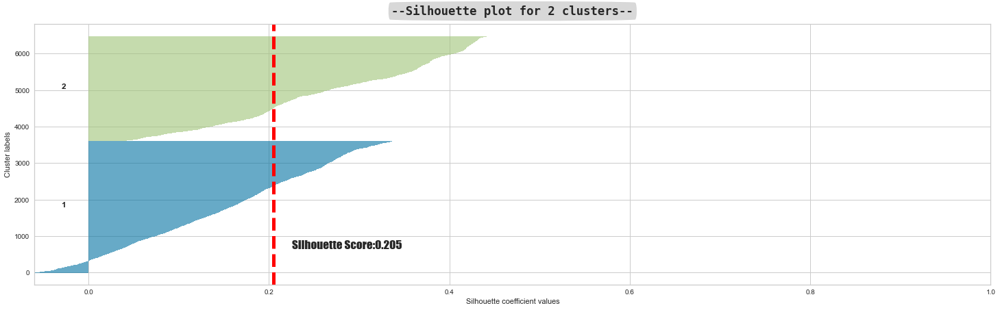

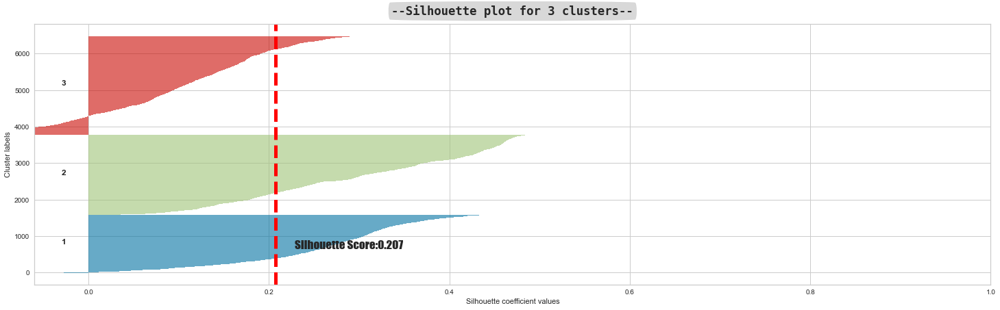

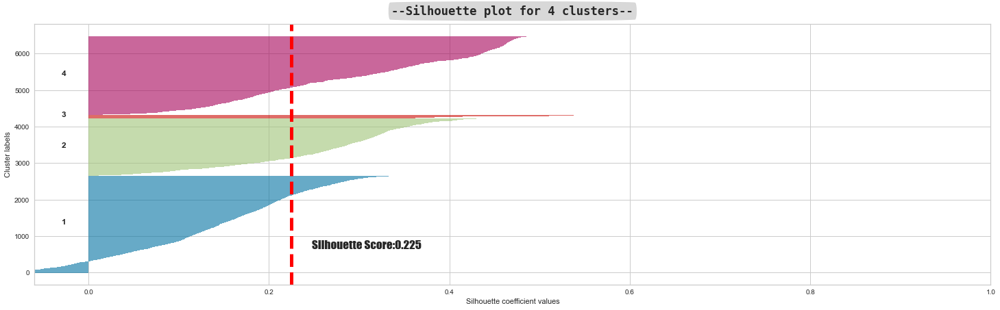

In [114]:
Clustering.grafico_silueta(df_procesed,[2,3,4])

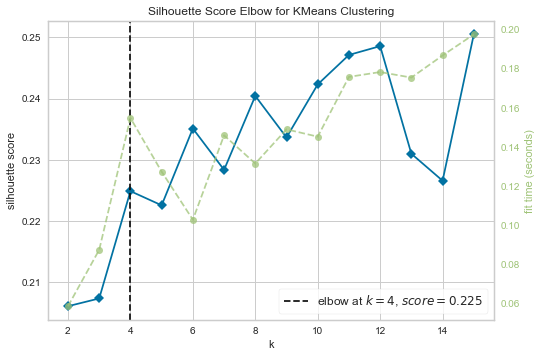

In [117]:
visualizer = KElbowVisualizer(KMeans(),k=(2,16),metric="silhouette").fit(df_procesed)
visualizer.show();

Vemos la silueta para los datos mapeados de energy_type:

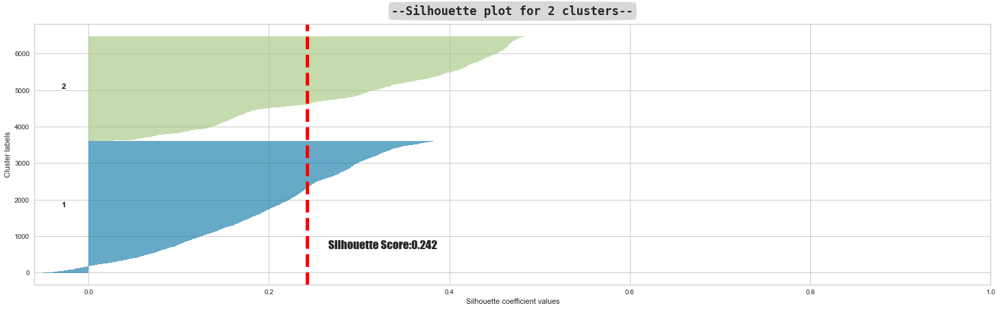

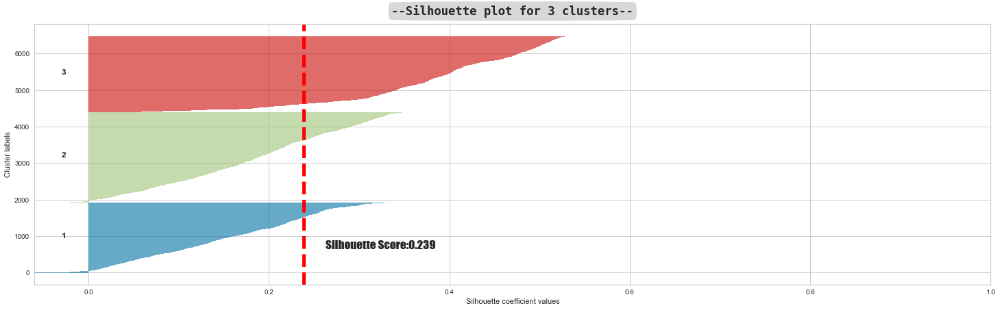

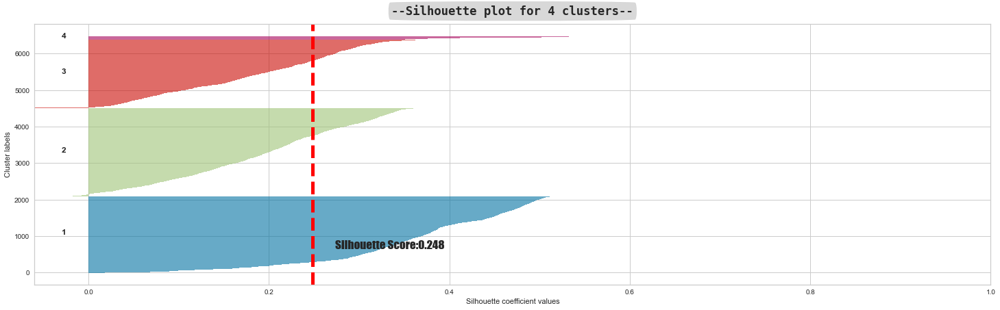

In [115]:
Clustering.grafico_silueta(df_procesed2,[2,3,4])

Observamos que los datos mejoran con el mapeado porque aunque el valor de silueta sigue siendo bajo, es mayor que en el caso en el que usabamos todas las variables, y además todos los cluster, en todas las clusterizaciones, tiene el coeficiente de silueta por encima del valor medio.

Como nos muestran los gráficos de silueta, el número de cluster óptimo, serian 4 al igual que con la prueba de elbow. ya que es quien tiene todos sus clusters por encima del coeficiente de silueta, y además el que tiene mayor coeficiente de silueta.  
En el caso de usar todas las variables nos cuesta saber en que categoría se están clasificando nuestros países porque no tenemos claro en base a que variables se está realizando la diferenciación de los clusters en el gráfico, como nos pasaba usando el Standard Scaler. Un score medio de silueta que empiece a ser bueno debería de estar por encima  de 0.5. Por eso vamos a probar con otro algoritmo de clasificación, que no intente agrupar los valores en una forma esférica, por su naturaleza de encontrar los valores más cercanos al centroide,y que por tanto cuando los valores tienen una forma diferente tenga un mejor desempeño. En resumen, para considerar que la clusterización es buena se tiene que cumplir que:
1. El score medio de la silueta general sea superior a 0.5
2. que la silueta de todos los clusters tengan un score medio superior al general.  

Como conclusiones sacamos que:
1. vamos a usar la codificación en base al co2 realizada por nosotros con el mapeado dado que al asignar unos pesos en función del nivel de co2 la clusterización es mejor y más clara
2. vamos a usar powertransformer en vez de StandardScaler para los datos numéricos pues asimila mejor los datos a una distribución normal y obtiene mejores datos de silueta.

La duda que nos surje es, ¿que combinación de variables es la mejor y en qué número?  

Para ello vamos a realizar una última prueba con las golden variables obtenidas en la parte de regressión, con el fin de unificar las variables usadas en cada parte del proyecto, si los datos que obtenemos son buenos.




In [33]:
# Las variables con las que nos quedamos para el modelo de regresión fueron:
golden_vars = ["Energy_production","CO2_emission","Energy_consumption",
                "balance","eficiency","co2_pc","energy_type"]
# con lo que el dataframe será:
golden_df = df_procesed2[golden_vars]
golden_df.head(2)

,Energy_production,CO2_emission,Energy_consumption,balance,eficiency,co2_pc,energy_type
0,-0.762928,-1.089275,-0.796767,-0.093147,-1.094163,-0.609601,0
1,1.371884,-1.089275,0.193666,1.415672,-1.094163,-0.609601,3


In [39]:
golden_kms = KMeans(n_clusters=4,random_state=1234).fit(golden_df)
px.scatter(data_frame=golden_df,x="Energy_production",y="CO2_emission",
            color=golden_kms.labels_.astype("str"),
            title="Golden Vars Clusterization")

c:\Users\ferna\miniconda3\envs\the_bridge_22\lib\site-packages\sklearn\cluster\_kmeans.py:1318: FutureWarning:

algorithm='full' is deprecated, it will be removed in 1.3. Using 'lloyd' instead.



Podemos ver que con todas las variables, el gráfico no es tan claro en la delimitación de los cluster.

In [36]:
golden_kms = KMeans(n_clusters=4,random_state=1234).fit(golden_df.iloc[:,:2])
px.scatter(data_frame=golden_df,x="Energy_production",y="CO2_emission",
            color=golden_kms.labels_.astype("str"),
            title="Golden Vars Clusterization")

Al final vemos que el modelo más claro y fácil de entender es el de dos variables y siendo estas co2 emission y energy production, que están dentro de las variables elegidas para la parte de regresión.

Vamos a probar con el modelo DBSCAN:
# DBSCAN (Density-Based Spatial Clustering of Applications with Noise)

DBSCAN es un algoritmo de clusterización basado en la densidad y por tanto asume que los clusters son regiones densas de datos en el espacio que están separados unos de otros por regiones menos densas de ellos. De esta manera, los datos agrupados densamente entre ellos son combinados en un cluster. Podemos identificar clusters en grandes datasets si observamos la densidad local de los datos.
Una característica única de la clusterización con DBSCAN es que maneja muy bien los outliers, debido a lo cual es aplicado en sistemas de detección de anomalias. Además de eso, no requiere que se le indique el número de clusters que se quieren, a diferencia de K-Means donde tenemos que especificar el número de centroides. Por otra parte, una de sus principales características, y que nos sirve en este caso según las conclusiones obtenidas con K-Means, es que puede detectar clusters que son complejos o que tienen una forma y tamaño aleatoria.

En principio probamos con los valores por defecto de DBSCAN:  
- eps = 0.5  
- min_samples = 5  
- metric = euclidean

In [9]:
# Usando LabelEncoder
Clustering.aplicacion_dbscan(df_procesed)

Número estimado de clusters: 196
Número estimado de puntos como ruido: 577
Silhouette Coefficient: 0.287


In [168]:
# Usando map
Clustering.aplicacion_dbscan(df_procesed2)

Número estimado de clusters: 196
Número estimado de puntos como ruido: 577
Silhouette Coefficient: 0.267


podemos ver que la clasificación es mala, aunque tenemos un coeficiente de silueta mejor que antes y que con Standard Scaler al principio, pero con 196 clusters que son demasiados. Dejándonos como ruido 577 datos, que es incluso peor que con Standard Scaler, que son datos que han quedado fuera de los cluster sin ser asignados,y que para el tamaño del dataset no se me hace elevado, y me hace pensar que dado el número de clusters obtenidos y el ruido generado, no vamos a mejorar mucho la clusterización. Pero vamos a ver cuanto podemos mejorar esto:

In [224]:
# Usando LabelEncoder
clusters = []
noise = []
sil_coef = []
eps = []
for i in np.linspace(0.1,1,10):
    db = DBSCAN(eps=i).fit(df_procesed)

    # Number of clusters in labels, ignoring noise if present.
    labels = db.labels_
    n_clusters_ = len(set(labels)) - (1 if -1 in labels else 0)
    n_noise_ = list(labels).count(-1)
    clusters.append(n_clusters_)
    noise.append(n_noise_)
    sil_coef.append(silhouette_score(df_procesed,labels))
    eps.append(i)
print("--------- eps = %0.3f ----------"% eps[sil_coef.index(max(sil_coef))])
print("Estimated number of clusters: %d" % clusters[sil_coef.index(max(sil_coef))])
print("Estimated number of noise points: %d" % noise[sil_coef.index(max(sil_coef))])
print("Silhouette Coefficient: %0.3f" % max(sil_coef))

--------- eps = 0.400 ----------
Estimated number of clusters: 240
Estimated number of noise points: 862
Silhouette Coefficient: 0.305


In [173]:
# Usando map
clusters = []
noise = []
sil_coef = []
eps = []
for i in np.linspace(0.1,1,10):
    db = DBSCAN(eps=i).fit(df_procesed2)

    # Number of clusters in labels, ignoring noise if present.
    labels = db.labels_
    n_clusters_ = len(set(labels)) - (1 if -1 in labels else 0)
    n_noise_ = list(labels).count(-1)
    clusters.append(n_clusters_)
    noise.append(n_noise_)
    sil_coef.append(silhouette_score(df_procesed2,labels))
    eps.append(i)
print("--------- eps = %0.3f ----------"% eps[sil_coef.index(max(sil_coef))])
print("Estimated number of clusters: %d" % clusters[sil_coef.index(max(sil_coef))])
print("Estimated number of noise points: %d" % noise[sil_coef.index(max(sil_coef))])
print("Silhouette Coefficient: %0.3f" % max(sil_coef))

--------- eps = 0.400 ----------
Estimated number of clusters: 240
Estimated number of noise points: 862
Silhouette Coefficient: 0.295


Mirando solo el eps, que es el valor más importante en DBSCAN, en un rango de 0.1 a 1 hemos encontrado que el número de clusters optimo son 240, con un ruido de 862 datos y un coeficiente de silueta que está muy lejos de ser bueno aún, pero que ha mejorado algo repecto al anterior. Siendo mejor con LabelEncoder que con map. Vamos a ampliar un poco más el eps y después pasaremos al minPts:

In [239]:
# Usando LabelEncoder
clusters = []
noise = []
sil_coef = []
eps = []
for i in tqdm(np.linspace(0.1,8,80)):
    db = DBSCAN(eps=i).fit(df_procesed)

    labels = db.labels_
    n_clusters_ = len(set(labels)) - (1 if -1 in labels else 0)
    n_noise_ = list(labels).count(-1)

    clusters.append(n_clusters_)
    noise.append(n_noise_)
    sil_coef.append(silhouette_score(df_procesed,labels))
    eps.append(i)

print("--------- eps = %0.5f ----------"% eps[sil_coef.index(max(sil_coef))])
print("Estimated number of clusters: %d" % clusters[sil_coef.index(max(sil_coef))])
print("Estimated number of noise points: %d" % noise[sil_coef.index(max(sil_coef))])
print("Silhouette Coefficient: %0.3f" % max(sil_coef))

100%|██████████| 80/80 [01:49<00:00,  1.37s/it]

--------- eps = 6.40000 ----------
Estimated number of clusters: 2
Estimated number of noise points: 0
Silhouette Coefficient: 0.587


In [240]:
# Usando map
clusters_map = []
noise_map = []
sil_coef_map = []
eps_map = []
for i in tqdm(np.linspace(0.1,8,80)):
    db = DBSCAN(eps=i).fit(df_procesed2)

    labels = db.labels_
    n_clusters_ = len(set(labels)) - (1 if -1 in labels else 0)
    n_noise_ = list(labels).count(-1)

    clusters_map.append(n_clusters_)
    noise_map.append(n_noise_)
    sil_coef_map.append(silhouette_score(df_procesed2,labels))
    eps_map.append(i)
    
print("--------- eps = %0.5f ----------"% eps_map[sil_coef_map.index(max(sil_coef_map))])
print("Estimated number of clusters: %d" % clusters_map[sil_coef_map.index(max(sil_coef_map))])
print("Estimated number of noise points: %d" % noise_map[sil_coef_map.index(max(sil_coef_map))])
print("Silhouette Coefficient: %0.3f" % max(sil_coef_map))

100%|██████████| 80/80 [01:48<00:00,  1.36s/it]

--------- eps = 6.40000 ----------
Estimated number of clusters: 2
Estimated number of noise points: 0
Silhouette Coefficient: 0.590


Seguimos igual que antes y esta clasificación aún siendo mala no nos sirve de nada para nuestro modelo, pues no mejora en nada al escalado con Standard Scaler. Vamos a probar con un GridSearch:

In [215]:
params = {
"eps":np.arange(0.1,10),
"min_samples":np.arange(2,10),
"metric":['euclidean',"cosine","manhattan"],
"algorithm":['auto',"ball_tree","kd_tree","brute"],
"leaf_size":np.arange(2,30)
}
grid = GridSearchCV(estimator=DBSCAN(),param_grid=params,scoring="mutual_info_score",n_jobs=-1).fit(df_procesed)

/Users/fersaol/opt/miniconda3/envs/thebridge_22/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/fersaol/opt/miniconda3/envs/thebridge_22/lib/python3.10/site-packages/sklearn/model_selection/_validation.py", line 765, in _score
    scores = scorer(estimator, X_test)
TypeError: _BaseScorer.__call__() missing 1 required positional argument: 'y_true'

  warnings.warn(
/Users/fersaol/opt/miniconda3/envs/thebridge_22/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/fersaol/opt/miniconda3/envs/thebridge_22/lib/python3.10/site-packages/sklearn/model_selection/_validation.py", line 765, in _score
    scores = score

KeyboardInterrupt: 

In [214]:
grid

GridSearchCV(estimator=DBSCAN(), n_jobs=-1,
             param_grid={'algorithm': ['auto', 'ball_tree', 'kd_tree', 'brute'],
                         'eps': array([0.1, 1.1, 2.1, 3.1, 4.1, 5.1, 6.1, 7.1, 8.1, 9.1]),
                         'leaf_size': array([ 2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16, 17, 18,
       19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29]),
                         'metric': ['euclidean', 'cosine', 'manhattan'],
                         'min_samples': array([2, 3, 4, 5, 6, 7, 8, 9])},
             scoring='mutual_info_score')

Veamos qué datos obtuvimos para 3 clusters y para 4 clusters, que es nuestro objetivo:

In [241]:
for i in range(len(clusters)):
    if clusters[i] == 3 or clusters[i] == 4:
        print(f"--------- eps = {eps[i]} ----------")
        print("Estimated number of clusters: %d" % clusters[i])
        print("Estimated number of noise points: %d" % noise[i])
        print("Silhouette Coefficient: %0.3f" % sil_coef[i])
        print("="*20)

--------- eps = 3.5000000000000004 ----------
Estimated number of clusters: 4
Estimated number of noise points: 3
Silhouette Coefficient: 0.491
--------- eps = 3.6 ----------
Estimated number of clusters: 4
Estimated number of noise points: 3
Silhouette Coefficient: 0.491
--------- eps = 3.7 ----------
Estimated number of clusters: 4
Estimated number of noise points: 3
Silhouette Coefficient: 0.491
--------- eps = 3.8000000000000003 ----------
Estimated number of clusters: 4
Estimated number of noise points: 3
Silhouette Coefficient: 0.491
--------- eps = 3.9000000000000004 ----------
Estimated number of clusters: 4
Estimated number of noise points: 3
Silhouette Coefficient: 0.491
--------- eps = 4.0 ----------
Estimated number of clusters: 4
Estimated number of noise points: 3
Silhouette Coefficient: 0.491
--------- eps = 4.1 ----------
Estimated number of clusters: 4
Estimated number of noise points: 3
Silhouette Coefficient: 0.491
--------- eps = 4.2 ----------
Estimated number of c

In [242]:
for i in range(len(clusters_map)):
    if clusters_map[i] == 3 or clusters_map[i] == 4:
        print(f"--------- eps = {eps_map[i]} ----------")
        print("Estimated number of clusters: %d" % clusters_map[i])
        print("Estimated number of noise points: %d" % noise_map[i])
        print("Silhouette Coefficient: %0.3f" % sil_coef_map[i])
        print("="*20)

--------- eps = 3.5000000000000004 ----------
Estimated number of clusters: 4
Estimated number of noise points: 4
Silhouette Coefficient: 0.464
--------- eps = 3.6 ----------
Estimated number of clusters: 4
Estimated number of noise points: 4
Silhouette Coefficient: 0.464
--------- eps = 3.7 ----------
Estimated number of clusters: 4
Estimated number of noise points: 3
Silhouette Coefficient: 0.494
--------- eps = 3.8000000000000003 ----------
Estimated number of clusters: 4
Estimated number of noise points: 2
Silhouette Coefficient: 0.533
--------- eps = 3.9000000000000004 ----------
Estimated number of clusters: 4
Estimated number of noise points: 2
Silhouette Coefficient: 0.533
--------- eps = 4.0 ----------
Estimated number of clusters: 4
Estimated number of noise points: 2
Silhouette Coefficient: 0.533
--------- eps = 4.1 ----------
Estimated number of clusters: 4
Estimated number of noise points: 2
Silhouette Coefficient: 0.533
--------- eps = 4.2 ----------
Estimated number of c

Aquí vemos que tenemos un coeficiente de silueta aceptable usando ambos encodings. Esta clasificación tiene más sentido y ayuda a confirmar a K-Means.Además, la clasificación de DBSCAN mejora la de K-means porque ahora tenemos un coeficiente de silueta general por encima de 0.5. Veamoslo representado en un scatterplot, y recordemos que no hemos tocado el parámetro minPts:

con LabelEncoder:  
- 4 clusters -> eps: rango(5,5.6), silueta: 0.545
- 3 clusters -> eps: rango(5.7,6.3), silueta: 0.549  

con map:  
- 4 clusters -> eps: rango(5,5.6), silueta: 0.548
- 3 clusters -> eps: rango(5.7,6.3), silueta: 0.551

In [252]:
# todos tienen ruido 0 y sale el mismo gráfico por lo que elegimos 5:
db2 = DBSCAN(eps=5).fit(df_procesed)
labels = db2.labels_.astype("str")
px.scatter(data_frame=df_procesed,x="Energy_production",y="CO2_emission",
color=labels, title="4 clusters con labelencoder y eps 5")

In [253]:
# vemos con map:
db2 = DBSCAN(eps=5).fit(df_procesed2)
labels = db2.labels_.astype("str")
px.scatter(data_frame=df_procesed2,x="Energy_production",y="CO2_emission",
color=labels, title="4 clusters con map y eps 5")

Esta clusterización aunque tenga un coeficiente de silueta mejor que con kmeans no es interpretable porque prácticamente todos los datos están en un solo cluster.
Para ver si hemos elegido bien vamos a utilizar el método del codo que usamos para k-means pero adaptado a DBSCAN, y vamos a ver que nos dice:

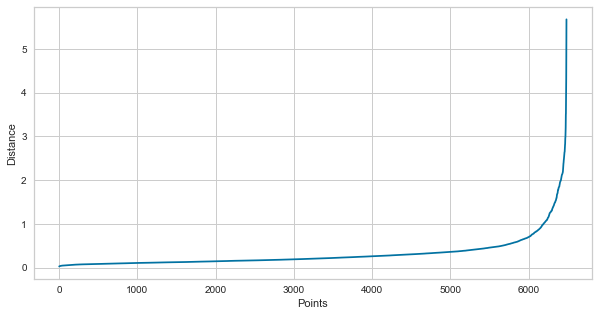

In [41]:
#Con LabelEncoder:
nearest_neighbors = NearestNeighbors(n_neighbors=5)
neighbors = nearest_neighbors.fit(df_procesed)

distances, indices = neighbors.kneighbors(df_procesed)
distances = np.sort(distances[:,4], axis=0)

fig = plt.figure(figsize=(10, 5))
plt.plot(distances)
plt.xlabel("Points")
plt.ylabel("Distance")
plt.show()

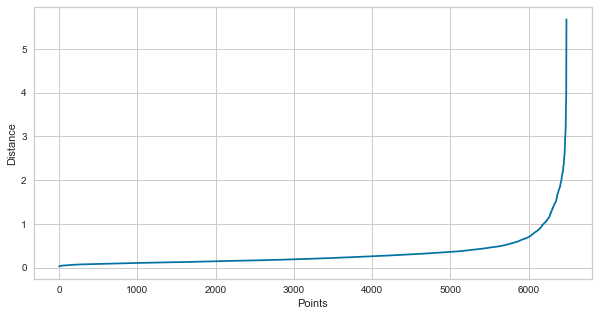

In [42]:
#Con map:
nearest_neighborsm = NearestNeighbors(n_neighbors=5)
neighborsm = nearest_neighborsm.fit(df_procesed2)

distancesm, indicesm = neighborsm.kneighbors(df_procesed2)
distancesm = np.sort(distancesm[:,4], axis=0)

fig = plt.figure(figsize=(10, 5))
plt.plot(distancesm)
plt.xlabel("Points")
plt.ylabel("Distance")
plt.show()

Comprobamos que para cada uno de los puntos que tenemos se produce un cambio drástico en la pendiente de la curva por encima de los 6000 datos y que el eps estará en torno a 0 y 1, pero visualmente no podemos verlo, por lo que vamos a calcular el eps óptimo que coincidirá justo con el punto en el que la pendiente de la curva se hace máxima.

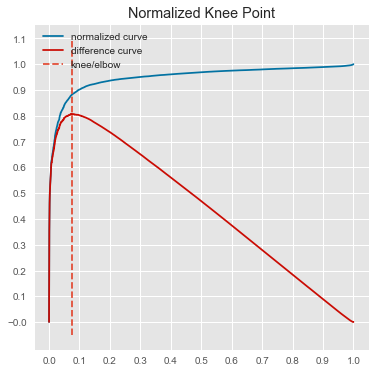

In [43]:
#Con LabelEncoder:
plt.style.use('ggplot')
i = np.arange(len(distances))
knee = KneeLocator(i, distances,S=4,curve='convex', direction='increasing', interp_method='interp1d')
knee.plot_knee_normalized()


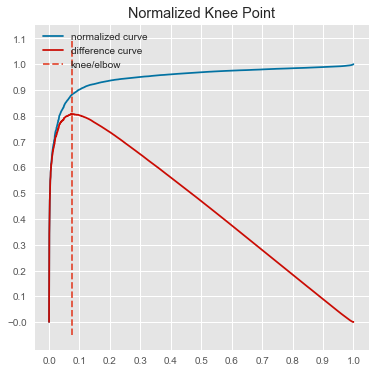

In [44]:
#Con map:
plt.style.use('ggplot')
i = np.arange(len(distancesm))
kneem = KneeLocator(i, distancesm,S=4,curve='convex', direction='increasing', interp_method='interp1d')
kneem.plot_knee_normalized()

In [45]:
# elbow con label encoder
distances[knee.knee]

0.6981145728891673

In [46]:
# elbow con map
distances[kneem.knee]

0.6981145728891673

In [47]:
# con la variable de label encoder
db3 = DBSCAN(eps=distances[knee.knee]).fit(df_procesed)
labels = db3.labels_

n_clusters_ = len(set(labels)) - (1 if -1 in labels else 0)
n_noise_ = list(labels).count(-1)

print("Estimated number of clusters: %d" % n_clusters_)
print("Estimated number of noise points: %d" % n_noise_)
print("Silhouette Coefficient: %0.3f" % silhouette_score(df_procesed, labels))

Estimated number of clusters: 149
Estimated number of noise points: 348
Silhouette Coefficient: 0.223


In [48]:
# con la variable map
db3 = DBSCAN(eps=distances[kneem.knee]).fit(df_procesed2)
labels = db3.labels_

n_clusters_ = len(set(labels)) - (1 if -1 in labels else 0)
n_noise_ = list(labels).count(-1)

print("Estimated number of clusters: %d" % n_clusters_)
print("Estimated number of noise points: %d" % n_noise_)
print("Silhouette Coefficient: %0.3f" % silhouette_score(df_procesed2, labels))

Estimated number of clusters: 149
Estimated number of noise points: 348
Silhouette Coefficient: 0.179


Podemos ver que para un número mínimo de datos de 5, como iniciamos nuestro estudio, el eps óptimo sería de 0.6981145728891673 y nos daría un número de clusters de 149, que es demasiado. Por tanto no nos sirve esta clasificación, además el coeficiente de silueta es más bajo que anteriormente con un eps de 4. Vamos a probar con diferentes números de datos mínimos y ver cual nos da mejor eps.  
Usando solamente el knee locator no nos da buenos resultados por lo que vamos a ir probando diferentes min_samples y para cada uno de ellos vamos a calcular el knee óptimo, luego vamos a realizar una clusterización con esos datos y vamos a ver cual es el mejor dato que obtenemos y los datos para tres y cuatro culsters.

In [52]:
clusters2 = []
ruido = []
eps_opt = []
siluete_score = []
min_datos = []
for minpts in tqdm(range(5,200)):
    
    nearest_neighbors = NearestNeighbors(n_neighbors=minpts)
    neighbors = nearest_neighbors.fit(df_procesed)

    distances, indices = neighbors.kneighbors(df_procesed)
    distances = np.sort(distances[:,minpts-1], axis=0)
    i = np.arange(len(distances))
    knee = KneeLocator(i, distances, S=1, curve='convex', direction='increasing', interp_method='interp1d')

    db4 = DBSCAN(eps=distances[knee.knee],min_samples=minpts).fit(df_procesed)
    labels = db4.labels_
    n_clusters_ = len(set(labels)) - (1 if -1 in labels else 0)
    n_noise_ = list(labels).count(-1)
    pts = distances[knee.knee]
    if pd.Series.nunique(pd.Series(labels)) > 1:
        siluete_score.append(silhouette_score(df_procesed,labels))
        eps_opt.append(pts)
        ruido.append(n_noise_)
        clusters2.append(n_clusters_)
        min_datos.append(minpts)
    else:
        continue

100%|██████████| 195/195 [09:05<00:00,  2.80s/it]


In [55]:
idx_max_silueta = siluete_score.index(max(siluete_score))
print("--------- eps = %0.5f ----------"% eps_opt[idx_max_silueta])
print("Estimated number of clusters: %d" % clusters2[idx_max_silueta])
print("Estimated number of noise points: %d" % ruido[idx_max_silueta])
print("Silhouette Coefficient: %0.3f" % max(siluete_score))

--------- eps = 6.69680 ----------
Estimated number of clusters: 2
Estimated number of noise points: 0
Silhouette Coefficient: 0.587


In [65]:
silcoef,number = np.unique(np.array(siluete_score),return_counts=True)
df_db_clu = pd.DataFrame({"silcoef":silcoef,"number":number})
df_db_clu.sort_values("silcoef",ascending=False).nlargest(3,columns="silcoef")

,silcoef,number
58,0.586887,17
57,0.586496,3
56,0.586119,12


In [98]:
best_idx = []
for i in siluete_score:
    if i == max(siluete_score):
        best_idx.append(clusters2[siluete_score.index(i)])
best_idx

[2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2]

Vemos que las 17 clusterizaciones con mejor indice de silueta se corresponden con una clasificación en dos clusters

In [66]:
# con labelencoder tenemos las siguientes clusterizaciones:
np.unique(np.array(clusters2))

array([ 1,  2,  3,  4,  5,  7, 10, 11, 12, 20, 32])

 Ahora vamos a ver los datos para los casos en que tenemos 3 y 4 clusters:

In [67]:
for i in range(len(clusters2)):
    if clusters2[i] == 3 or clusters2[i] == 4:
        print(f"n.clusters: {clusters2[i]}")
        print(f"eps: {eps_opt[i]}")
        print(f"siluete: {siluete_score[i]}")
        print(f"ruido: {ruido[i]}")
        print(f"minPts: {min_datos[i]}")
        print("|"*30)

n.clusters: 4
eps: 2.7205973419265597
siluete: 0.47484472657582844
ruido: 36
minPts: 13
||||||||||||||||||||||||||||||
n.clusters: 4
eps: 2.71575129962867
siluete: 0.47484472657582844
ruido: 36
minPts: 15
||||||||||||||||||||||||||||||
n.clusters: 4
eps: 2.6867857395589376
siluete: 0.4732987052097087
ruido: 38
minPts: 16
||||||||||||||||||||||||||||||
n.clusters: 4
eps: 2.7810316412140588
siluete: 0.4750528299235764
ruido: 35
minPts: 17
||||||||||||||||||||||||||||||
n.clusters: 4
eps: 3.1953599498724903
siluete: 0.4877602472098152
ruido: 23
minPts: 20
||||||||||||||||||||||||||||||
n.clusters: 3
eps: 2.8406327390285466
siluete: 0.5150905001461275
ruido: 53
minPts: 21
||||||||||||||||||||||||||||||
n.clusters: 3
eps: 4.44198585390296
siluete: 0.5440793215290881
ruido: 24
minPts: 22
||||||||||||||||||||||||||||||
n.clusters: 3
eps: 3.4685701071418023
siluete: 0.5382975896781946
ruido: 30
minPts: 23
||||||||||||||||||||||||||||||
n.clusters: 3
eps: 3.457201086698757
siluete: 0.5356936552

Miramos con la versíon mapeada de energy_type

In [102]:
clusters2_mapping = []
ruido_mapping = []
eps_opt_mapping = []
siluete_score_mapping = []
min_datos_mapping = []
for minpts in tqdm(range(5,200)):
    
    nearest_neighbors = NearestNeighbors(n_neighbors=minpts)
    neighbors = nearest_neighbors.fit(df_procesed2)

    distances, indices = neighbors.kneighbors(df_procesed2)
    distances = np.sort(distances[:,minpts-1], axis=0)
    i = np.arange(len(distances))
    knee = KneeLocator(i, distances, S=1, curve='convex', direction='increasing', interp_method='interp1d')

    db4 = DBSCAN(eps=distances[knee.knee],min_samples=minpts).fit(df_procesed2)
    labels = db4.labels_
    n_clusters_ = len(set(labels)) - (1 if -1 in labels else 0)
    n_noise_ = list(labels).count(-1)
    pts = distances[knee.knee]
    if pd.Series.nunique(pd.Series(labels)) > 1:
        siluete_score_mapping.append(silhouette_score(df_procesed2,labels))
        eps_opt_mapping.append(pts)
        ruido_mapping.append(n_noise_)
        clusters2_mapping.append(n_clusters_)
        min_datos_mapping.append(minpts)
    else:
        continue

100%|██████████| 195/195 [08:15<00:00,  2.54s/it]


In [103]:
# con map las diferentes clusterizaciones son:
np.unique(np.array(clusters2_mapping))

array([ 1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 17])

In [104]:
silcoef,number = np.unique(np.array(siluete_score_mapping),return_counts=True)
df_db_clu = pd.DataFrame({"silcoef":silcoef,"number":number})
df_db_clu.sort_values("silcoef",ascending=False).nlargest(3,columns="silcoef")

,silcoef,number
58,0.589912,21
57,0.589524,1
56,0.589149,25


In [105]:
best_idx = []
for i in siluete_score_mapping:
    if i == max(siluete_score_mapping):
        best_idx.append(clusters2_mapping[siluete_score_mapping.index(i)])
best_idx

[2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2]

In [112]:
# el segundo mejor cluster
second_best = df_db_clu.sort_values("silcoef",ascending=False).nlargest(3,columns="silcoef").iloc[1,0]
best_idx = []
for i in siluete_score_mapping:
    if i == second_best:
        best_idx.append(clusters2_mapping[siluete_score_mapping.index(i)])
best_idx

[1]

In [111]:
# El tercer mejor cluster:
third_best = df_db_clu.sort_values("silcoef",ascending=False).nlargest(3,columns="silcoef").iloc[2,0]
best_idx = []
for i in siluete_score_mapping:
    if i == third_best:
        best_idx.append(clusters2_mapping[siluete_score_mapping.index(i)])
best_idx

[1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]

Vemos que tenemos un rango de clusters que va desde 1 hasta 32 si usamos labelencoder y de 1 hasta 17 si usamos map,variando el número mínimo de puntos que debe contener cada cluster, y usando el mejor eps asociado a él.

El mejor resultado para 3 y 4 clusters lo enconcontramos para labelencoder con los siguientes hiperparámetros:  
- eps: rango(3.843431657146041 , 4.337917253237848)
- minPts: [25,26,27,28,30,31]
- ruido: 25 en todos
- valor del silhouette score: 0.543990735711809 en todos  

Elegimos el que tiene menor valor de minPts pues el resto es igual en todos, para representarlo

In [17]:
db_minpts = DBSCAN(eps=3.843431657146041,min_samples=25).fit(df_procesed)
labels = db_minpts.labels_.astype("str")
px.scatter(data_frame=df_procesed,x="Energy_production",y="CO2_emission",
color=labels, title="4 clusters con labelencoder y eps 5")

Nos sale un gráfico prácticamente igual al anterior donde no habíamos optimizado los puntos mínimos y el silhouette score no es mejor

In [310]:
for i in range(len(clusters2_mapping)):
    if clusters2_mapping[i] == 3 or clusters2_mapping[i] == 4:
        print(f"n.clusters: {clusters2_mapping[i]}")
        print(f"eps: {eps_opt_mapping[i]}")
        print(f"siluete: {siluete_score_mapping[i]}")
        print(f"ruido: {ruido_mapping[i]}")
        print(f"minPts: {min_datos_mapping[i]}")
        print("|"*30)

n.clusters: 4
eps: 2.793531966036049
siluete: 0.4847280759356699
ruido: 25
minPts: 15
||||||||||||||||||||||||||||||
n.clusters: 4
eps: 2.937970129544405
siluete: 0.5016799804724279
ruido: 22
minPts: 17
||||||||||||||||||||||||||||||
n.clusters: 4
eps: 4.545694586693754
siluete: 0.5326252365548316
ruido: 2
minPts: 18
||||||||||||||||||||||||||||||
n.clusters: 3
eps: 3.303523225677863
siluete: 0.5432836310946292
ruido: 33
minPts: 19
||||||||||||||||||||||||||||||
n.clusters: 3
eps: 3.313993663057943
siluete: 0.5432836310946292
ruido: 33
minPts: 20
||||||||||||||||||||||||||||||
n.clusters: 3
eps: 3.3148989320399855
siluete: 0.5432836310946292
ruido: 33
minPts: 21
||||||||||||||||||||||||||||||
n.clusters: 3
eps: 3.3543495746048793
siluete: 0.5432836310946292
ruido: 33
minPts: 23
||||||||||||||||||||||||||||||
n.clusters: 3
eps: 3.416695641265697
siluete: 0.5432836310946292
ruido: 33
minPts: 24
||||||||||||||||||||||||||||||
n.clusters: 3
eps: 3.843431657146041
siluete: 0.548511861127737

Con map conseguimos los mismos clusters de antes con algo mejor de silueta, pero tampoco son datos mejores que los obtenidos anteriormente solo con 5 min_samples:  
- n.clusters: 3
- eps: 3.7525199979910475
- siluete: 0.5493478609673635
- ruido: 30
- minPts: 32

Si tenemos en cuenta los mejores datos que obtuvimos en la parte 1 del notebook

|medida|antes elbow|después elbow|
|------|-----------|-------------|
|clusters|        4|            4|
|eps   |        3.6|3.176005889262874|
|siluete|     0.574|0.605381743153619|
|ruido|          32|           47|
|min_samples|     5|           9|

Podemos ver que DBSCAN trabaja mejor con StandardScaler() y esto puede tener sentido porque con StandardScaler los datos son más densos, o están más juntos, y el algoritmo trabaja en base a la densidad de los mismos. De igual manera vemos que KMeans trabaja mejor con los datos de PowerTransformer porque tienen una forma menos densa y más definida en la que puede establecer clusters circulares, podemos sobre todo apreciarlo cuando solo usamos dos variables.
Por lo que nuestra decision sobre que clusterización usar está entre:
* usar StandardScaler con LabelEncoder y DBSCAN que nos ofrece un coeficiente de silueta mayor para 4 clusters que kmeans.
* usar PowerTransformer con map y KMeans con dos variables que nos da sencillez y una mayor interpretabilidad de los datos

# CONCLUSIÓN
Vamos a elegir a kmeans con dos variables (CO2_emission,Energy_production) y 4 clusters por las siguientes razones:

1. El coeficiente de silueta medio es bueno, siendo este 0.585. Es más bajo que en DBSCAN porque tiene los países más repartidos entre los clusters y por tanto el cluster mayoritario pierde peso en la media respecto a los otros. Estas diferencias son muy acusadas en DBSCAN y nos lleva a tener un coeficiente medio muy superior pero con una dispersión de los datos entre clusters muy elevada, lo cual no lo es tanto en Kmeans.
2. Todas las siluetas tienen un coeficiente por encima de 0.5 y por encima del coeficiente medio, esto no ocurre con DBSCAN.
3. La silueta más importante, al igual que pasa con DBSCAN para las mismas dos variables, tiene su coeficiente de silueta cercano a 0.9 y refleja el hecho de que existe un cluster mayoritario en el dataset, como en DBSCAN.
4. El gráfico y la caracterización de los clusters de KMEANS tiene una mayor facilidad de interpretación y, habiendo estudiado los datos mediante el EDA, se ajusta muy bien a la realidad de los datos representados en el dataset.

In [23]:
# añadimos los clusters al dataset y los guardamos
pathwin = "C:/Users/ferna/OneDrive/Documentos/MIS_COSAS_DE_THE_BRIDGE/Proyectos_Machine_Learning/co2_ml/src/data/processed/"
pathmac = "/Users/fersaol/Library/CloudStorage/OneDrive-Personal/Documentos/MIS_COSAS_DE_THE_BRIDGE/Proyectos_Machine_Learning/co2_ml/src/data/processed/"
nombre = "df_clusters_v1.csv"
df["clusters"] = clustering_prueba.labels_
df["energy_type"] = df["Energy_type"].map(own_scale)
df.head(3)

,GDP,Population,Energy_production,Energy_consumption,CO2_emission,per_capita_production,Energy_intensity_by_GDP,balance,eficiency,energy_dependecy,...,co2_pc,latitude,longitude,Year,Country,Energy_type,CODE_x,continent,clusters,energy_type
0,279.389,15182.6,0.150,0.155,0.0,104.341,5.67,-0.005,0.0,0.001,...,0.0,6.424,-66.59,1980-01-01,Venezuela,renewables_n_other,VEN,South America,1,0
1,279.389,15182.6,5.000,0.812,0.0,104.341,5.67,4.188,0.0,0.003,...,0.0,6.424,-66.59,1980-01-01,Venezuela,petroleum_n_other_liquids,VEN,South America,3,3
2,279.389,15182.6,0.616,0.616,0.0,104.341,5.67,0.000,0.0,0.002,...,0.0,6.424,-66.59,1980-01-01,Venezuela,natural_gas,VEN,South America,3,2


In [25]:
df.to_csv(pathmac + nombre,index=False,header=True)